#### **Library importation**

In [267]:
!pip install optuna
!pip install alibi
!pip install lime

In [93]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [94]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from sklearn.datasets import fetch_california_housing
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn import tree
from xgboost import plot_tree
import xgboost as xgb

In [95]:
import numpy as np
import pandas as pd
import optuna
from sklearn.preprocessing import MinMaxScaler
import xgboost

from utils import encode_features, get_train_test_data, train_model, evaluate_model, generate_individual, epsilon_rounding, get_relevant_candidates

optuna.logging.set_verbosity(optuna.logging.WARNING)

In [96]:
import random, ast
import numpy as np
import matplotlib.pyplot as plt
import torch
import torchvision
from torchvision import models, transforms
import os

from PIL import Image
from lime import lime_image
from skimage.segmentation import mark_boundaries

In [157]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
import seaborn as sns #conda install seaborn
import matplotlib.pyplot as plt
import xgboost
from IPython.display import display, HTML # conda install ipython
from lime.lime_tabular import LimeTabularExplainer
# Depending on conda environment, conda install -c conda-forge lime  OR pip install lime

In [192]:
from itertools import combinations
import numpy as np
import pandas as pd
from sklearn.datasets import load_diabetes
import seaborn as sns
import matplotlib.pyplot as plt
import dcor # pip install dcor
import xgboost
import math
from sklearn.model_selection import train_test_split

In [194]:
import numpy as np
import os
import pandas as pd
import shap
import xgboost
from sklearn.model_selection import train_test_split
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.datasets import load_diabetes
shap.initjs() # Don't worry if this doesn't work for you. Comment it out and carry on

# conda install pytorch::pytorch
# conda install pytorch::torchvision
import torch
from torch import optim, nn
from torchvision import transforms, datasets
import torch.nn.functional as F

## **Homework 1**

In [240]:
california = fetch_california_housing(as_frame=True)
X = california.data
y = california.target
print("Dataset shape:", X.shape)

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,
    random_state=42
)

Dataset shape: (20640, 8)


### **Model black box training**

In [241]:
model_bbox = xgb.XGBRegressor(
    n_estimators=300,
    max_depth=6,
    learning_rate=0.05,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42
)

model_bbox.fit(X_train, y_train)

y_pred_test = model_bbox.predict(X_test)
r2_bbox = r2_score(y_test, y_pred_test)
mse_bbox = mean_squared_error(y_test, y_pred_test)
rmse_bbox = np.sqrt(mse_bbox)

print(f"XGBoost R² (test): {r2_bbox:.3f}")
print(f"XGBoost RMSE (test): {rmse_bbox:.3f}")


XGBoost R² (test): 0.843
XGBoost RMSE (test): 0.453


### **Surrogate model (Decision Tree)**

Now the target for our surrogate model is the prediction on X_train provide by Black Box model

In [99]:
target_surrogate = model_bbox.predict(X_train)

In [100]:
surrogate_tree = DecisionTreeRegressor(
    max_depth=3,
    random_state=42
)
surrogate_tree.fit(X_train, target_surrogate)
pred_tree = surrogate_tree.predict(X_train)

r2_tree = r2_score(target_surrogate, pred_tree)
mse_tree = mean_squared_error(target_surrogate, pred_tree)
rmse_tree = np.sqrt(mse_tree)


In [101]:
print(f"Fidelity surrogate TREE:   R²={r2_tree:.3f}, RMSE={rmse_tree:.3f}")


Fidelity surrogate TREE:   R²=0.639, RMSE=0.643


MedInc: 0.853
HouseAge: 0.000
AveRooms: 0.028
AveBedrms: 0.000
Population: 0.000
AveOccup: 0.120
Latitude: 0.000
Longitude: 0.000


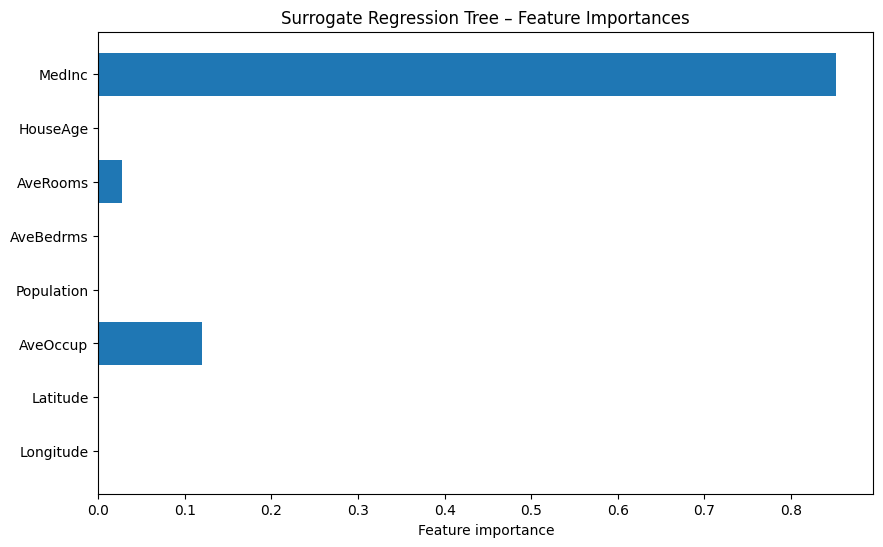

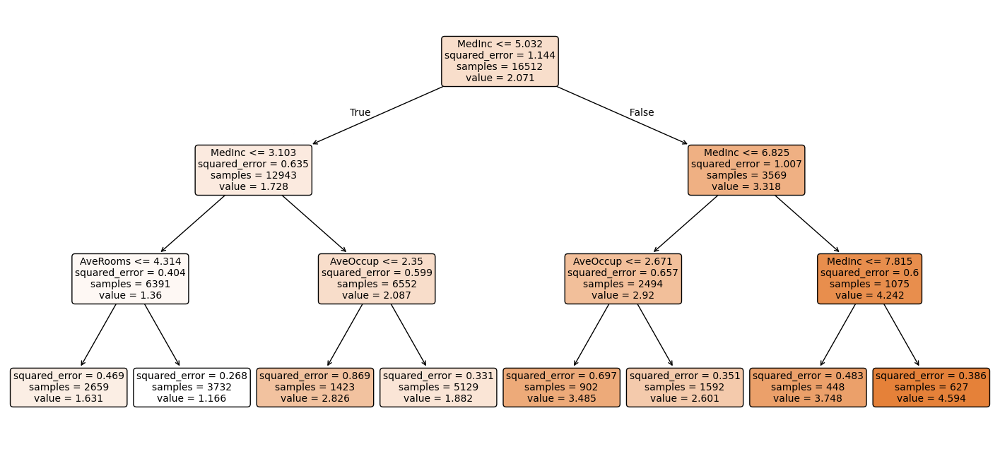

In [102]:
for name, imp in zip(X.columns, surrogate_tree.feature_importances_):
    print(f"{name}: {imp:.3f}")

plt.figure(figsize=(10,6))
plt.barh(X.columns, surrogate_tree.feature_importances_)
plt.xlabel("Feature importance")
plt.title("Surrogate Regression Tree – Feature Importances")
plt.gca().invert_yaxis()
plt.show()

# Plot of surrogate regression tree that give the gloable explaination Here
plt.figure(figsize=(18,8))
tree.plot_tree(
    surrogate_tree,
    feature_names=X.columns,
    filled=True,
    rounded=True,
    fontsize=10
)
plt.show()



### Metrics Surrogate model on original dataset train

In [246]:
pred_true = surrogate_tree.predict(X_train)

r2_true = r2_score(target_surrogate, pred_true)
mse_true = mean_squared_error(y_train, pred_true)
rmse_true = np.sqrt(mse_true)

In [247]:
print(f"Fidelity surrogate TREE on true data:   R²={r2_true:.3f}, RMSE={rmse_true:.3f}")

Fidelity surrogate TREE on true data:   R²=0.639, RMSE=0.786


Now let train a ante-hoc regression tree directly  on original data to see the difference


In [103]:
model_direct_DTree = DecisionTreeRegressor(
    max_depth=3,
    random_state=42
)
model_direct_DTree.fit(X_train, y_train)

y_pred_direct_DTree = model_direct_DTree.predict(X_train)
r2_direct_DTree = r2_score(y_train, y_pred_direct_DTree)
mse_direct_DTree = mean_squared_error(y_train, y_pred_direct_DTree)
rmse_direct_DTree = np.sqrt(mse_direct_DTree)

print(f"Direct tree R² (train): {r2_direct_DTree:.3f}")
print(f"Direct tree RMSE (train): {rmse_direct_DTree:.3f}")



Direct tree R² (train): 0.538
Direct tree RMSE (train): 0.786


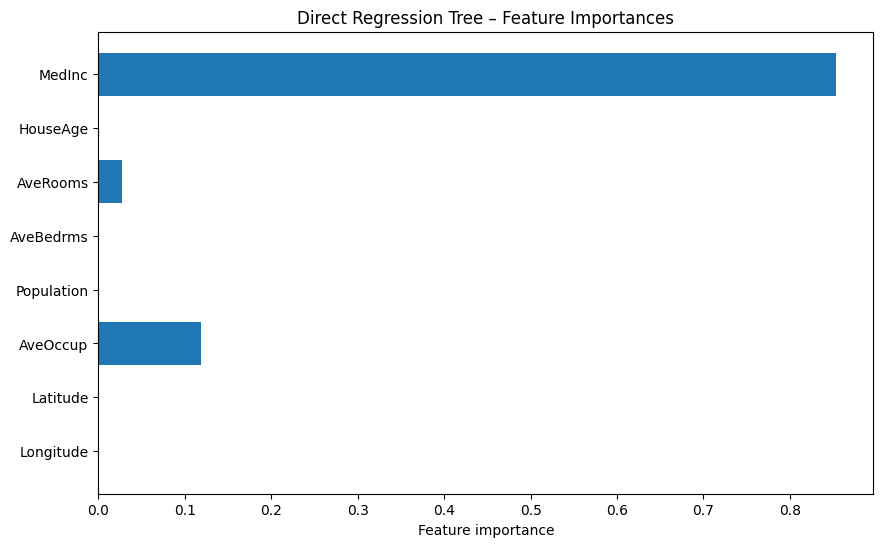

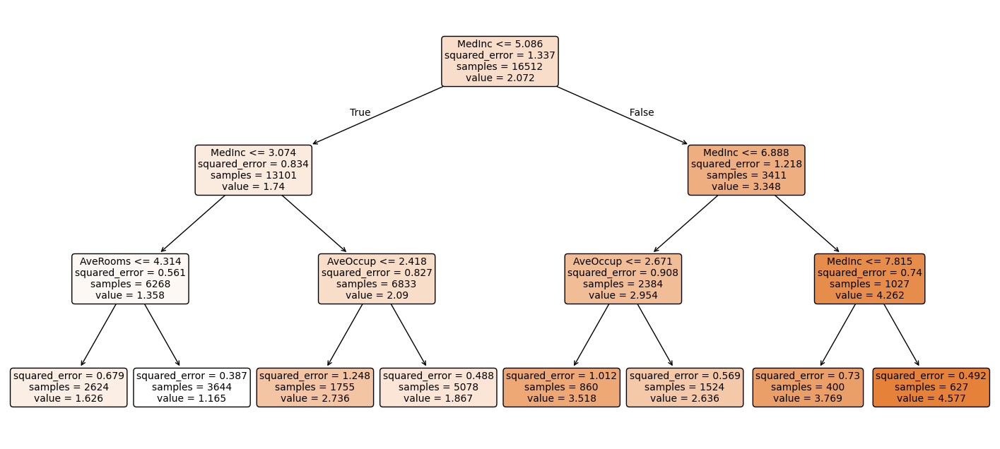

In [104]:
plt.figure(figsize=(10,6))
plt.barh(X.columns, model_direct_DTree.feature_importances_)
plt.xlabel("Feature importance")
plt.title("Direct Regression Tree – Feature Importances")
plt.gca().invert_yaxis()
plt.show()

plt.figure(figsize=(18,8))
tree.plot_tree(
    model_direct_DTree,
    feature_names=X.columns,
    filled=True,
    rounded=True,
    fontsize=10
)
plt.show()

We can see that the surrogate model has almost learned the information better than a raw, naive model, and this is due to the fact that the black-box model has good performance. The R² of the surrogate is closer to 1, which shows that it explains the variance of the data very well. Thus, we have our black-box model, we train our surrogate on it, and we generate explanations based on the data predicted by the black box. We have only added this comparison on the real data to show that we gain in performance, but also that we are able to explain the predictions well.

### **Surrogate model (Linear Regressor)**

In [105]:
surrogate_linear = LinearRegression()
surrogate_linear.fit(X_train, target_surrogate)

pred_linear = surrogate_linear.predict(X_train)
r2_linear = r2_score(target_surrogate, pred_linear)
mse_linear = mean_squared_error(target_surrogate, pred_linear)
rmse_linear = np.sqrt(mse_linear)
print(f"Fidelity surrogate LINEAR: R²={r2_linear:.3f}, RMSE={rmse_linear:.3f}")

Fidelity surrogate LINEAR: R²=0.719, RMSE=0.567


In [106]:
coef_df_surrogate = pd.DataFrame({
    "Feature": X.columns,
    "Coefficient": surrogate_linear.coef_,
    "AbsCoefficient": np.abs(surrogate_linear.coef_)
}).sort_values("AbsCoefficient", ascending=False)
print("Importance according to linear surrogate")
print(coef_df_surrogate)

Importance according to linear surrogate
      Feature  Coefficient  AbsCoefficient
3   AveBedrms     0.871284        0.871284
0      MedInc     0.465192        0.465192
7   Longitude    -0.406282        0.406282
6    Latitude    -0.392175        0.392175
2    AveRooms    -0.144483        0.144483
1    HouseAge     0.010374        0.010374
5    AveOccup    -0.003691        0.003691
4  Population     0.000001        0.000001


In [107]:
model_direct_LR = LinearRegression(
)
model_direct_LR.fit(X_train, y_train)

y_pred_direct_LR = model_direct_LR.predict(X_train)
r2_direct_LR = r2_score(y_train, y_pred_direct_LR)
mse_direct_LR = mean_squared_error(y_train, y_pred_direct_LR)
rmse_direct_LR = np.sqrt(mse_direct_DTree)

print(f"Linear Regressor R²  on the train: {r2_direct_LR:.3f}")
print(f"Linear Regressor  RMSE on the train: {rmse_direct_LR:.3f}")

coef_df_LR = pd.DataFrame({
    "Feature": X.columns,
    "Coefficient": model_direct_LR.coef_,
    "AbsCoefficient": np.abs(model_direct_LR.coef_)
}).sort_values("AbsCoefficient", ascending=False)
print("Importance according to linear surrogate")
print(coef_df_LR)

Linear Regressor R²  on the train: 0.613
Linear Regressor  RMSE on the train: 0.786
Importance according to linear surrogate
      Feature  Coefficient  AbsCoefficient
3   AveBedrms     0.783145        0.783145
0      MedInc     0.448675        0.448675
7   Longitude    -0.433708        0.433708
6    Latitude    -0.419792        0.419792
2    AveRooms    -0.123323        0.123323
1    HouseAge     0.009724        0.009724
5    AveOccup    -0.003526        0.003526
4  Population    -0.000002        0.000002


Here we can notice the rank of feature is almost the same , what the surrogate model keept and what a ante-hoc directly on original data keep.

## Homework 2

In [249]:
def load_data(data_filepath="/content/drive/MyDrive/data/Loan_data_extracted.csv"):
    """
    Input: path to .csv data file

    TODO: specify in feature_info whether features are of type:
        fixed, meaning cannot change for the counterfactual
        unique, meaning can only take existing categorical values
        increase, meaning their value can only increase and not decrease
        range, meaning their new value can take a range of values

    Returns:
        dataframe and feature configuration dictionary
    """
    df = pd.read_csv(data_filepath)
    df = df.drop('Loan_ID', axis=1)
    df = df.dropna()

    feature_config = {
        "categorical": ["Gender", "Married", "Education", "Self_Employed", "Property_Area", "Loan_Status"],
        "feature_info": [
            ('Gender', 'fixed'),
            ('Married', 'fixed'),
            ('Dependents', 'unique'),
            ('Education', 'fixed'),
            ('Self_Employed', 'unique'),
            ('ApplicantIncome', 'increase'),
            ('CoapplicantIncome', 'increase'),
            ('LoanAmount', 'range'),
            ('Loan_Amount_Term', 'unique'),
            ('Credit_History', 'unique'),
            ('Property_Area', 'fixed'),
        ],


        "categorical_features": ["Gender", "Married", "Education", "Self_Employed", "Property_Area"]
    }

    return df, feature_config

In [250]:
df, feature_config =load_data(data_filepath="/content/drive/MyDrive/data/Loan_data_extracted.csv")
df.head(3)

,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area,Loan_Status
0,Male,No,0,Graduate,No,3676,4301,172.0,360,1,Rural,Y
1,Female,Yes,1,Graduate,No,12000,0,496.0,360,1,Semiurban,Y
3,Male,Yes,1,Graduate,No,3400,2500,173.0,360,1,Semiurban,Y


In [251]:
df.nunique()

,0
Gender,2
Married,2
Dependents,4
Education,2
Self_Employed,2
ApplicantIncome,10
CoapplicantIncome,6
LoanAmount,10
Loan_Amount_Term,2
Credit_History,2


In [252]:
# Load the model from the saved file
model = xgboost.XGBClassifier()
model.load_model("xgboost_model.json")

In [253]:
def misfit(x_prime, y_target, model):
    """
    Optimisation criterion 1
    Calculate absolute difference between y_target and y_prime_prediction.
    """

    #TODO
    y_prime_prediction = model.predict_proba(x_prime)[0][1]
    abs_diff = np.abs(y_prime_prediction - y_target)
    return float(abs_diff)

In [254]:
def distance(X, x, x_prime, numerical, categorical):
    """
    Optimisation criterion 2
    Calculate distance between x_prime and x.
    """
    # Normalize data
    scaler = MinMaxScaler()
    scaler.fit(X[numerical])
    x_normalized = scaler.transform(x[numerical])
    x_prime_normalized = scaler.transform(x_prime[numerical])

    # Compute distances
    #TODO
    num_distance = np.abs(x_prime_normalized - x_normalized).sum()
    cat_distance  = (x[categorical] != x_prime[categorical]).sum(axis = 1).iloc[0]
    return (num_distance + cat_distance)/x_prime.shape[1]


In [255]:
def sparsity(x, x_prime):
    """
    Optimisation criterion 3
    Return number of unchanged features.
    """
    #TODO
    return (x == x_prime).sum(axis = 1).iloc[0]


In [256]:
def closest_real(X, x_prime, categorical, numerical):
    """
    Optimisation criterion 4
    Return the minimum distance between x_prime and any point in X.
    """
    scaler = MinMaxScaler()
    X_normalized = scaler.fit_transform(X[numerical])
    x_prime_normalized = scaler.transform(x_prime[numerical])

    # Compute total distance
    #TODO
    obs_number = X_normalized.shape[0]
    min = np.inf
    for i in range(obs_number):
       num_distance = np.abs(X_normalized[i,:] - x_prime_normalized).sum()
       cat_distance = (X.iloc[i][categorical] != x_prime[categorical]).sum(axis = 1).iloc[0]
       distance = num_distance + cat_distance
       if distance < min :
        min = distance
    features_number = x_prime.shape[1]
    return float(min/features_number)

In [257]:
def objective(trial, X, x, features, model, y_target, numerical, categorical):
    x_prime = x.copy()
    for feature in features:
        feature.sample(trial)
        x_prime[feature.name] = feature.value
    epsilon_rounding(x, x_prime, 1e-1)

    obj1 = misfit(x_prime, y_target, model)
    obj2 = distance(X, x, x_prime, numerical, categorical)
    obj3 = sparsity(x, x_prime)
    obj4 = closest_real(X, x_prime, categorical, numerical)

    return obj1, obj2, obj3, obj4


In [258]:
def get_counterfactuals(X, x, y_target, model,
                        numerical, categorical, features,
                        tol, optimization_steps, timeout):

    study = optuna.create_study(directions=['minimize', 'minimize', 'maximize', 'minimize'],
                                sampler=optuna.samplers.NSGAIISampler(seed=42))

    study.optimize(lambda trial: objective(trial, X, x, features, model,
                                           y_target,
                                           numerical,
                                           categorical),
                   n_trials=optimization_steps,
                   timeout=timeout)

    candidates_df = get_relevant_candidates(study, x, model, y_target, tol)

    return candidates_df

In [259]:
# Check that our customer x did not get the loan
X_obs, feat_conf = load_data(data_filepath="/content/drive/MyDrive/data/Loan_data_extracted.csv")
X_obs = encode_features(X_obs, feat_conf["categorical"])
customer = np.array([0,1,0,0,0,2000,1500,1000,480,0,1])
x = pd.DataFrame([customer], columns=X_obs.columns[:-1].tolist())
x


--- 
Encoded categorical features as follows:
Gender :  {'Female': 0, 'Male': 1}
Married :  {'No': 0, 'Yes': 1}
Education :  {'Not Graduate': 0, 'Graduate': 1}
Self_Employed :  {'No': 0, 'Yes': 1}
Property_Area :  {'Rural': 0, 'Semiurban': 1, 'Urban': 2}
Loan_Status :  {'N': 0, 'Y': 1}
---


,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area
0,0,1,0,0,0,2000,1500,1000,480,0,1


In [260]:
print(f"Probability of original instance (x): {model.predict_proba(x)[:, 1]}")

Probability of original instance (x): [0.00302464]


In [261]:
# TODO
y_obs_pred = model.predict(x)
print(f"{y_obs_pred}")
# and help her find out what she has to do in order to get the loan
# If you have implemented everything above correctly, the code below
# will find the counterfactuals

[0]


In [262]:
# Make a list of Feature objects containing information about how
# each feature is allowed to change when generating counterfactuals
change_features = generate_individual(X_obs, x, feat_conf["feature_info"])

In [263]:
# Set the desired new model prediction
y_CF = 0.7
print(f"Searching for counterfactuals with y_CF = {y_CF}...\n")
numerical_features = [x for x in df.columns if x not in feat_conf["categorical"]]
CFS = get_counterfactuals(X_obs, x, y_CF, model,
                          numerical_features,
                          feat_conf["categorical_features"],
                          change_features,
                          tol=0.05,
                          optimization_steps=500,
                          timeout=None)

Searching for counterfactuals with y_CF = 0.7...



In [264]:
x

,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area
0,0,1,0,0,0,2000,1500,1000,480,0,1


In [265]:
CFS

,Gender,Married,Dependents,Education,Self_Employed,ApplicantIncome,CoapplicantIncome,LoanAmount,Loan_Amount_Term,Credit_History,Property_Area
0,0.0,1.0,0.0,0.0,0.0,2000.0,1500.0,173.877881,360.0,1.0,1.0


In [266]:
print(f"Probability of original instance (x): {model.predict_proba(x)[:, 1]}")
print(f"Probability of counterfactuals (CFS): {model.predict_proba(CFS)[:, 1]}")

Probability of original instance (x): [0.00302464]
Probability of counterfactuals (CFS): [0.25187543]


We can say that it would be difficult for this client to obtain this loan. Their probability of getting the loan was close to zero, and we were able to increase it to 0.25187543 with our analysis. This also depends on the fact that, technically, we fixed several variables to avoid discrimination, as well as the number of iterations.

### Let's use Alibi to compare

## Homework 3

In [152]:
df = pd.read_csv('/content/drive/MyDrive/data/titanic_data.csv')
df = df[["pclass","sex","age","survived"]]
df.dropna(inplace=True)

features = df.columns

# Column sex is type string. Encode it to numerical
mapping = {"female": 0, "male": 1}
df["sex"] = df["sex"].map(mapping)

# Train test split
X_data = df[['pclass', 'sex', 'age']].values
y_data = df['survived'].values
X_train, X_test, y_train, y_test = train_test_split(X_data, y_data, test_size=0.3)

In [153]:
def accuracy(true_values, predictions):
    return np.mean(true_values == predictions)
classifier = xgboost.XGBClassifier()
classifier.fit(X_train, y_train)

probs = classifier.predict(X_test)

print("Model accuracy: ", accuracy(y_test, probs))

Model accuracy:  0.8325581395348837


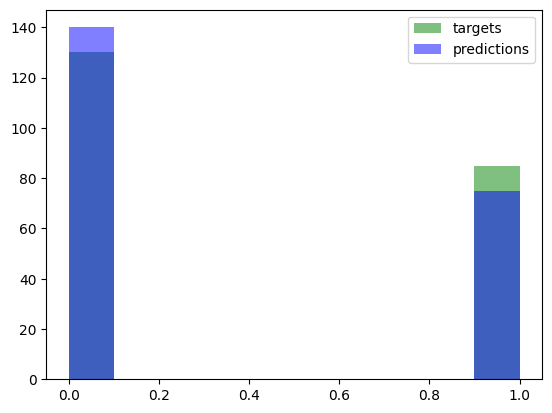

In [154]:
plt.hist(y_test, color="green", alpha=0.5, label="targets")
plt.hist(probs, color="blue", alpha=0.5, label="predictions")
plt.legend()
plt.show()

In [155]:
regressor = xgboost.XGBRegressor(random_state=50)
regressor.fit(X_train, y_train)
probs = regressor.predict(X_test)
classes = [0 if _p<0.5 else 1 for _p in probs]
print("Model accuracy: ", accuracy(y_test, classes))

Model accuracy:  0.8093023255813954


In [158]:
# Instantiate explainer objects
lime_regressor = LimeTabularExplainer(X_train,
                                        feature_names=features,
                                        verbose=True,
                                        mode='regression')

lime_classifier = LimeTabularExplainer(X_train,
                                        feature_names=features,
                                        verbose=True,
                                        mode='classification')

In [159]:
X_jack = np.array([3,1,21])
X_rose = np.array([1,0,17])

In [160]:
exp_lime = lime_classifier.explain_instance(X_jack, classifier.predict_proba, num_features=3)

#exp_lime.show_in_notebook()
# Workaround with same kwargs as show_in_notebook
html = exp_lime.as_html()
display(HTML(html))

Intercept 1.0756276024133147
Prediction_local [0.28610848]
Right: 0.0873211


In [161]:
exp_lime = lime_regressor.explain_instance(X_jack, regressor.predict, num_features=3)
html = exp_lime.as_html()
display(HTML(html))

Intercept 1.09686906238306
Prediction_local [0.20829126]
Right: 0.09704529


In [162]:
exp_lime = lime_classifier.explain_instance(X_rose, classifier.predict_proba, num_features=3)
html = exp_lime.as_html()
display(HTML(html))

Intercept 0.16023087121979657
Prediction_local [1.18334716]
Right: 0.9973803


In [163]:
exp_lime = lime_regressor.explain_instance(X_rose, regressor.predict, num_features=3)
html = exp_lime.as_html()
display(HTML(html))

Intercept 0.11423170951419848
Prediction_local [1.16133131]
Right: 1.0433902


In [164]:
X_kid = np.array([3, 0, 16])
regressor.predict([X_kid])
exp_lime = lime_regressor.explain_instance(X_kid, regressor.predict, num_features=3)
html = exp_lime.as_html()
display(HTML(html))

Intercept 0.3927917055132162
Prediction_local [0.88571056]
Right: 0.5056101


In [165]:
import random, ast
import numpy as np
import matplotlib.pyplot as plt
import torch
import torchvision
from torchvision import models, transforms
import os

from PIL import Image
from lime import lime_image
from skimage.segmentation import mark_boundaries

See info and class indices at
https://deeplearning.cms.waikato.ac.nz/user-guide/class-maps/IMAGENET/


In [166]:
model = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)

# Classification function for LIME

Define the classification function LIME needs.
Input: numpy array of images where each image is ndarray of shape (channel, height, width).
Output: numpy array of shape (image index, classes) where each value in array should be probability for that image, class combination.

In [167]:
def prediction_function(images):
    model.eval()
    images_transformed = torch.stack(tuple(preprocess_transform(i) for i in images), dim=0)

    device = "cuda" if torch.cuda.is_available() else "cpu"
    model.to(device)
    model.eval()

    logits = model(images_transformed)
    preds = logits.softmax(dim=1)
    return preds.detach().cpu().numpy()

# Image loading and preprocessing

In [168]:
with open("/content/drive/MyDrive/imagenet1000_clsidx_to_labels.txt", "r", encoding="utf-8") as f:
    text = f.read()
labels_dict = ast.literal_eval(text)

In [169]:
def get_image(path):
    with open(os.path.abspath(path), 'rb') as f:
        with Image.open(f) as img:
            return img.convert('RGB')


def get_pil_transform():
    transf = transforms.Compose([
        transforms.Resize((256, 256)),
        transforms.CenterCrop(224)
    ])

    return transf

def get_preprocess_transform():
    normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                    std=[0.229, 0.224, 0.225])
    transf = transforms.Compose([
        transforms.ToTensor(),
        normalize
    ])

    return transf

pill_transf = get_pil_transform()
preprocess_transform = get_preprocess_transform()

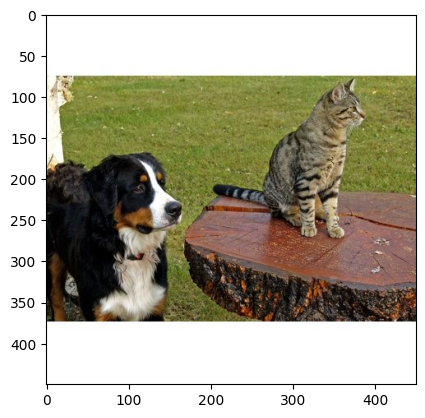

In [170]:
img = get_image('/content/drive/MyDrive/cat_dog.png')
plt.imshow(img)
plt.show()

# LIME

In [171]:
explainer = lime_image.LimeImageExplainer()
explanation = explainer.explain_instance(np.array(pill_transf(img)),
                                         prediction_function,
                                         # number of labels (with highest prob) to show
                                         top_labels=5,
                                         # size of the neighborhood to learn the linear model
                                         num_samples=1000)

  0%|          | 0/1000 [00:00<?, ?it/s]

In [172]:
explanation.top_labels

[240, 239, 241, 238, 281]

In [173]:
top_classes = [labels_dict[_label] for _label in explanation.top_labels]
print(top_classes)

['Appenzeller', 'Bernese mountain dog', 'EntleBucher', 'Greater Swiss Mountain dog', 'tabby, tabby cat']


Overlay the mask on from LIME on the image to see which areas encourage the top prediction

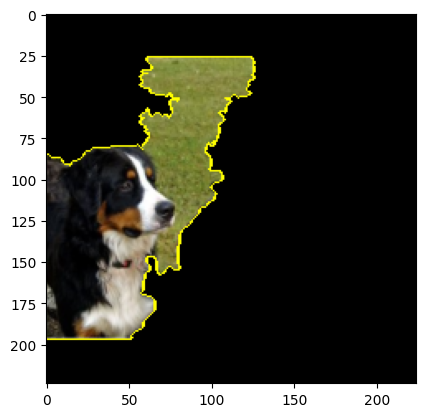

In [174]:
image, mask = explanation.get_image_and_mask(explanation.top_labels[1],
                                              # only include superpixels contributing positively
                                             positive_only=True,
                                             # number of superpixels to show
                                             num_features=6,
                                             # turn off the non-explanation part
                                             hide_rest=True)
img_boundary = mark_boundaries(image/255.0, mask)
plt.imshow(img_boundary)
plt.show()

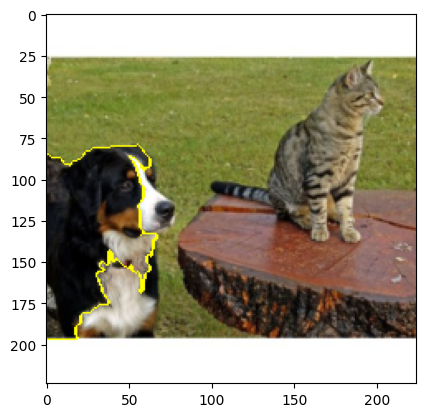

In [175]:
image, mask = explanation.get_image_and_mask(explanation.top_labels[1],
                                              # only include superpixels contributing positively
                                             positive_only=True,
                                             # number of superpixels to show
                                             num_features=3,
                                             # turn off the non-explanation part
                                             hide_rest=False)
img_boundary = mark_boundaries(image/255.0, mask)
plt.imshow(img_boundary)
plt.show()

Display areas also areas that contribute against the top prediction.

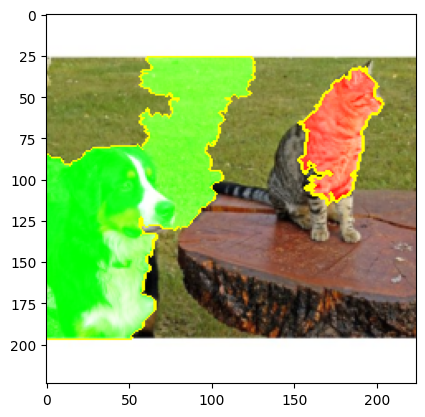

In [176]:
image, mask = explanation.get_image_and_mask(explanation.top_labels[1],
                                                         positive_only=False,
                                                         negative_only=False,
                                                         num_features=7,
                                                         hide_rest=False)
img_boundary = mark_boundaries(image/255.0, mask)
plt.imshow(img_boundary)
plt.show()

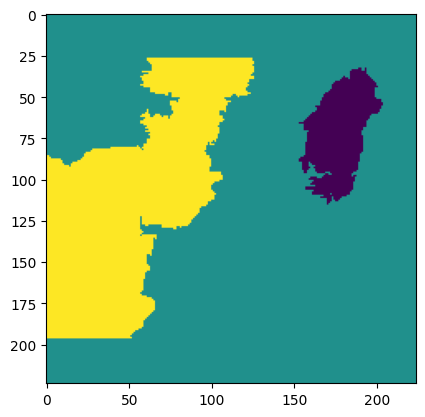

In [177]:
plt.imshow(mask)
plt.show()

In [178]:
np.unique(np.array(mask))

array([-1,  0,  1])

## Other images

  0%|          | 0/1000 [00:00<?, ?it/s]

['tench, Tinca tinca', 'bolete', 'armadillo', 'isopod', 'mud turtle']


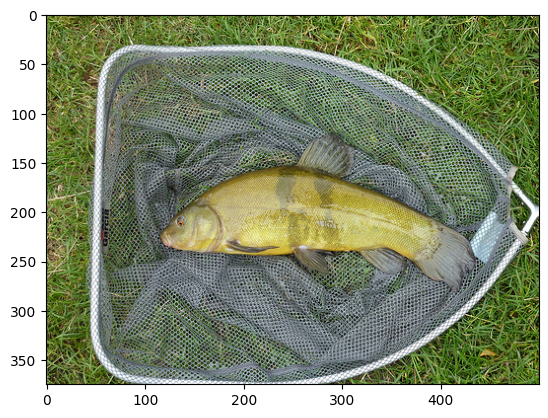

In [179]:
img = get_image('/content/drive/MyDrive/fish.jpg')
plt.imshow(img)

explainer = lime_image.LimeImageExplainer()
explanation = explainer.explain_instance(np.array(pill_transf(img)),
                                         prediction_function,
                                         top_labels=5,
                                         num_samples=1000)

top_classes = [labels_dict[_label] for _label in explanation.top_labels]
print(top_classes)

In [ ]:
image, mask = explanation.get_image_and_mask(explanation.top_labels[0],
                                             positive_only=False,
                                             num_features=3,
                                             hide_rest=False)
img_boundary = mark_boundaries(image/255.0, mask)
plt.imshow(img_boundary)
plt.show()

In [ ]:
img = get_image('/content/drive/MyDrive/aquarium.jpg')
plt.imshow(img)

explainer = lime_image.LimeImageExplainer()
explanation = explainer.explain_instance(np.array(pill_transf(img)),
                                         prediction_function,
                                         top_labels=5,
                                         num_samples=1000)

top_classes = [labels_dict[_label] for _label in explanation.top_labels]
print(top_classes)

In [ ]:
image, mask = explanation.get_image_and_mask(explanation.top_labels[0],
                                             positive_only=False,
                                             num_features=10,
                                             hide_rest=False)
img_boundary = mark_boundaries(image/255.0, mask)
plt.imshow(img_boundary)
plt.show()

## Your own picture

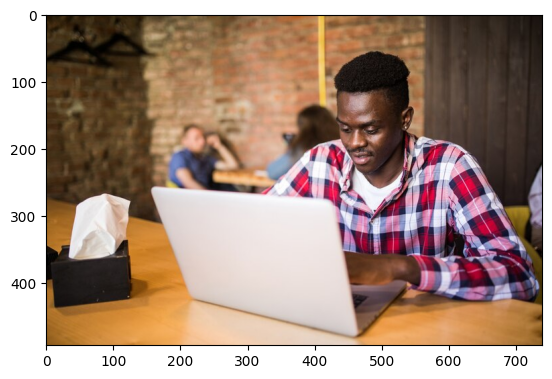

In [181]:
img = get_image('/content/drive/MyDrive/my_picture.jpg')
plt.imshow(img)
plt.show()

In [184]:
explainer = lime_image.LimeImageExplainer()
explanation = explainer.explain_instance(np.array(pill_transf(img)),
                                         prediction_function,
                                         # number of labels (with highest prob) to show
                                         top_labels=5,
                                         # size of the neighborhood to learn the linear model
                                         num_samples=1000)

  0%|          | 0/1000 [00:00<?, ?it/s]

In [185]:
top_classes = [labels_dict[_label] for _label in explanation.top_labels]
print(top_classes)

['notebook, notebook computer', 'laptop, laptop computer', 'carton', 'crossword puzzle, crossword', 'cleaver, meat cleaver, chopper']


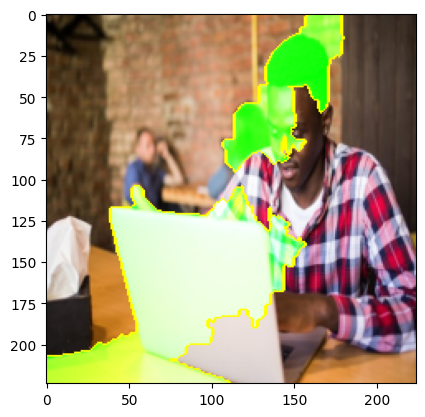

In [186]:
image, mask = explanation.get_image_and_mask(explanation.top_labels[0],
                                             positive_only=False,
                                             num_features=5,
                                             hide_rest=False)
img_boundary = mark_boundaries(image/255.0, mask)
plt.imshow(img_boundary)
plt.show()

We can see here that the model detected 'notebook, notebook computer', 'laptop, laptop computer' more than the others, but LIME's explanation focuses more on these elements.

# Homework 4

In [187]:
def calc_shapley_value(player_index, all_players, cf_dict):
    """
    Calculate the Shapley value for player index
    Input:
        all_players, list of player indices
        cf_dict, dictionary containing characteristic function values for all players
    """
    players = all_players.copy()
    if player_index in players:
        players.remove(player_index)
    #TODO
    contribution = 0
    players_len = len(all_players)
    for i in range(players_len):
      size_value = 0
      for coalition, value in  cf_dict.items():
        if len(coalition) == i and player_index not in coalition:
          size_value += cf_dict[tuple(sorted(coalition + (player_index,)))] - value
      contribution += (1/players_len) * (1/math.comb(players_len-1 ,i)) * size_value
    return contribution

### The Shapley decomposition

In [195]:
players = [1,2,3]
cf_dict = {():0, (1,):3, (2,):7, (3,):10,
           (1,2):7, (1,3):10, (2,3):10,
           (1,2,3):10}

print(calc_shapley_value(1, players, cf_dict))
print(calc_shapley_value(2, players, cf_dict))
print(calc_shapley_value(3, players, cf_dict))

1.0
2.9999999999999996
6.0


In [196]:
players = [1,2,3]
cf_dict = {():0, (1,):3, (2,):7, (3,):10,
           (1,2):7, (1,3):10, (2,3):10,
           (1,2,3):10}

print(calc_shapley_value(1, players, cf_dict))
print(calc_shapley_value(2, players, cf_dict))
print(calc_shapley_value(3, players, cf_dict))

1.0
2.9999999999999996
6.0


In [197]:
players = [1,2,3,4]
cf_dict = {():0, (1,):0, (2,):3, (3,):3, (4,):7,
           (1,2):3, (1,3):3, (1,4):7, (2,3):3, (2,4):7, (3,4):7,
           (1,2,3):3, (1,2,4):7, (1,3,4):7, (2,3,4):7,
           (1,2,3,4):7}

print(calc_shapley_value(1, players, cf_dict))
print(calc_shapley_value(2, players, cf_dict))
print(calc_shapley_value(3, players, cf_dict))
print(calc_shapley_value(4, players, cf_dict))

0.0
1.0
1.0
5.0


In [198]:
players = [1,2,3]
cf_dict = {():0, (1,):2, (2,):4, (3,):5, (1,2):3, (1,3):3, (2,3):2, (1,2,3):3}
print(calc_shapley_value(1, players, cf_dict))
print(calc_shapley_value(2, players, cf_dict))
print(calc_shapley_value(3, players, cf_dict))

0.49999999999999994
1.0
1.4999999999999998


### From game theory to machine learning

In [199]:
X_data, y_data = load_diabetes(scaled=True, as_frame=True, return_X_y=True)
features = X_data.columns.to_numpy()
features

array(['age', 'sex', 'bmi', 'bp', 's1', 's2', 's3', 's4', 's5', 's6'],
      dtype=object)

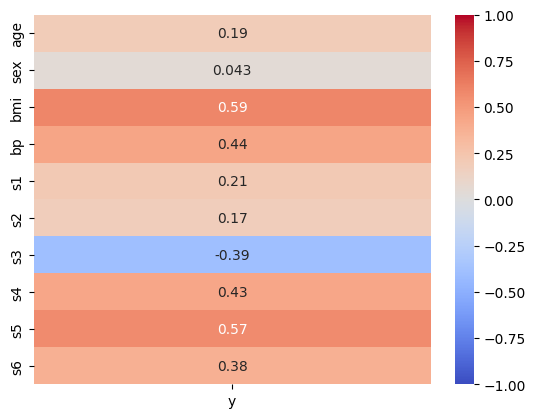

In [200]:
df = pd.concat([X_data, y_data.rename("y")], axis=1)
corr = df.corr(numeric_only=True)
sns.heatmap(corr.loc[X_data.columns, ["y"]], annot=True, vmin=-1, vmax=1, cmap="coolwarm")
plt.show()

In [201]:
def calc_shapley_values(x, cf_dict):
    """
    Returns the shapley values for features x, given a
    dictionary cf_dict containing the characteristic function values.
    """

    players = list(range(x.shape[1]))
    shapley_values = []
    for _player in players:
        shapley_values.append(calc_shapley_value(_player, players, cf_dict))
    return shapley_values

def sort_shapley_values(values, features):
    return zip(*sorted(zip(values, features), reverse=True))

def flatten(tup):
    """
    Flatten any nested tuple
    """
    if len(tup) < 1:
        return tup
    if isinstance(tup[0], tuple):
        return flatten(tup[0]) + flatten(tup[1:])
    return tup[:1] + flatten(tup[1:])

def make_cf_dict(x, y, characteristic_function):
    """
    Creates dictionary with values of the characteristic function for each
    combination of the players.
    """
    cf_dict = {}
    num_players = x.shape[1]
    players = list(range(num_players))
    coalition_sizes = list(range(num_players+1))

    for _size in coalition_sizes:
        coalitions_of_size_s = list(combinations(players, _size))
        for _coalition in coalitions_of_size_s:
            _coalition = tuple(sorted(flatten(_coalition)))
            cf_dict[_coalition] = characteristic_function(x, y, _coalition)

    return cf_dict

def characteristic_function_r2(x, y, coalition):
    """
    Returns the coefficient of determination between the indices of x indicated in coalition and y
    Input:
        x, numpy array shape (#samples, #features)
        y, numpy array shape (#samples, )
        coalition, tuple of indices of features to include
    """
    if len(coalition)==0:
        return 0.0
    x = x[:, coalition]

    # --- Coefficient of determination, R2
    det_C_xy = np.linalg.det(np.corrcoef(x.T, y))
    if len(coalition)==1:
        det_C_x = 1
    else:
        det_C_x = np.linalg.det(np.corrcoef(x.T))

    return (1 - det_C_xy/det_C_x)

In [202]:
cf_dict_R2 = make_cf_dict(X_data.to_numpy(), y_data.to_numpy(), characteristic_function_r2)
print(len(cf_dict_R2))
print(2**len(features))

1024
1024


In [203]:
shapley_values = calc_shapley_values(X_data.to_numpy(), cf_dict_R2)

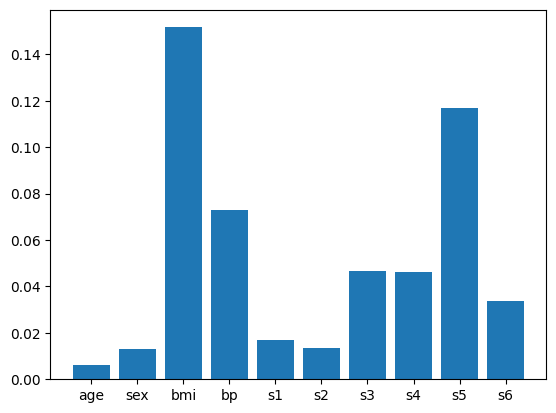

In [204]:
plt.bar(range(len(shapley_values)), shapley_values)
plt.xticks(range(len(shapley_values)), features)
plt.show()

In [206]:
def characteristic_function_dcor(x, y, coalition):
    if len(coalition)==0:
        return 0.0

    x = x[:, coalition]

    return dcor.distance_correlation(x,y)

In [207]:
cf_dict_dcor = make_cf_dict(X_data.to_numpy(), y_data.to_numpy(), characteristic_function_dcor)
shapley_values_dcor = calc_shapley_values(X_data, cf_dict_dcor)

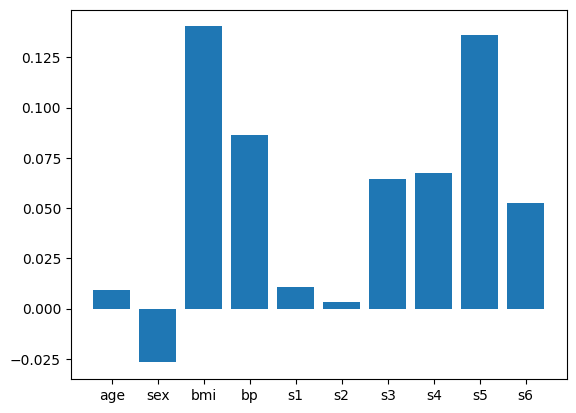

In [209]:
plt.bar(range(len(shapley_values_dcor)), shapley_values_dcor)
plt.xticks(range(len(shapley_values_dcor)), features)
plt.show()

In [208]:
_, sorted_features = sort_shapley_values(shapley_values, features)
print(sorted_features)
_, sorted_features_dcor = sort_shapley_values(shapley_values_dcor, features)
print(sorted_features_dcor)

('bmi', 's5', 'bp', 's3', 's4', 's6', 's1', 's2', 'sex', 'age')
('bmi', 's5', 'bp', 's4', 's3', 's6', 's1', 'age', 's2', 'sex')


In [210]:
x_train, x_test, y_train, y_test = train_test_split(X_data, y_data, test_size=0.33, random_state=42)

regressor = xgboost.XGBRegressor()
regressor.fit(x_train, y_train);

In [211]:
y_pred = regressor.predict(x_test)

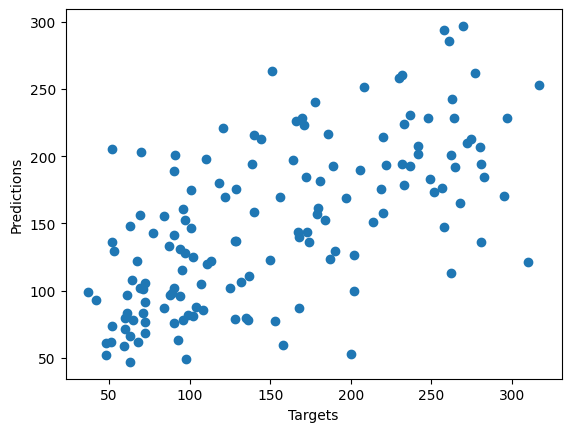

In [212]:
plt.scatter(y_test, y_pred)
plt.xlabel("Targets")
plt.ylabel("Predictions")
plt.show()

In [213]:
cf_dict_dcor_targets = make_cf_dict(x_test.to_numpy(), y_test.to_numpy(), characteristic_function_dcor)
shapley_values_targets = calc_shapley_values(x_test.to_numpy(), cf_dict_dcor_targets)

In [214]:
cf_dict_dcor_preds = make_cf_dict(x_test.to_numpy(), np.array(y_pred), characteristic_function_dcor)
shapley_values_preds = calc_shapley_values(x_test.to_numpy(), cf_dict_dcor_preds)

/usr/local/lib/python3.12/dist-packages/dcor/_fast_dcov_avl.py:554: UserWarning: Falling back to uncompiled AVL fast distance covariance terms because of TypeError exception raised: No matching definition for argument type(s) array(float64, 1d, C), array(float32, 1d, C), bool. Rembember: only floating point values can be used in the compiled implementations.
  warnings.warn(


In [215]:
def plot_shapley_comparison(values_0, values_1,feature_names=None, nametags=[0,1]):
    assert len(values_0) == len(values_1)
    num = range(1,len(values_0)+1)
    colors = ["blue", "pink"]

    for _n, _values in enumerate([values_0, values_1]):
        _col = colors[_n]
        plt.scatter(num,_values,c=_col,marker='s',alpha=0.7,label=f"Shapley values {nametags[_n]}")

    plt.ylabel("Shapley values")
    plt.legend()
    if feature_names is not None:
        ax = plt.gca()
        ax.set_xticks(num)
        ax.set_xticklabels(feature_names,rotation=45)
    plt.show()

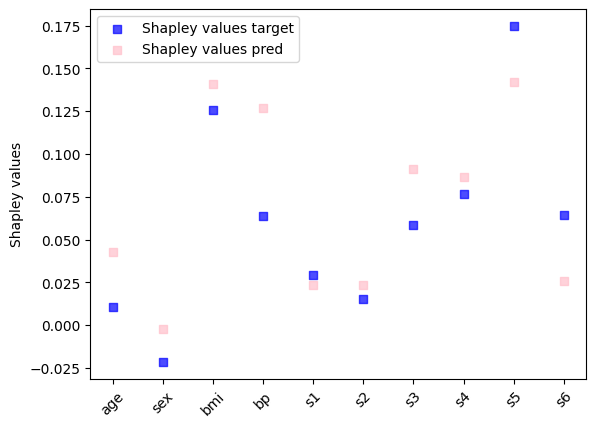

In [216]:
plot_shapley_comparison(shapley_values_targets, shapley_values_preds, features, ["target", "pred"])

## **Homework 5**

In [217]:
X_data, y_data = load_diabetes(scaled=False, as_frame=True, return_X_y=True)
features = X_data.columns.to_numpy()
print(features)
# I also love np arrays, but keep the dataframe structure if you want feature names on your SHAP plot
x_train, x_test, y_train, y_test = train_test_split(X_data, y_data, test_size=0.33, random_state=42)

['age' 'sex' 'bmi' 'bp' 's1' 's2' 's3' 's4' 's5' 's6']


In [218]:
regressor = xgboost.XGBRegressor()
regressor.fit(x_train, y_train);

In [219]:
explainer = shap.TreeExplainer(regressor, data=x_train)
shap_values = explainer.shap_values(x_test)

### **Violin plot**

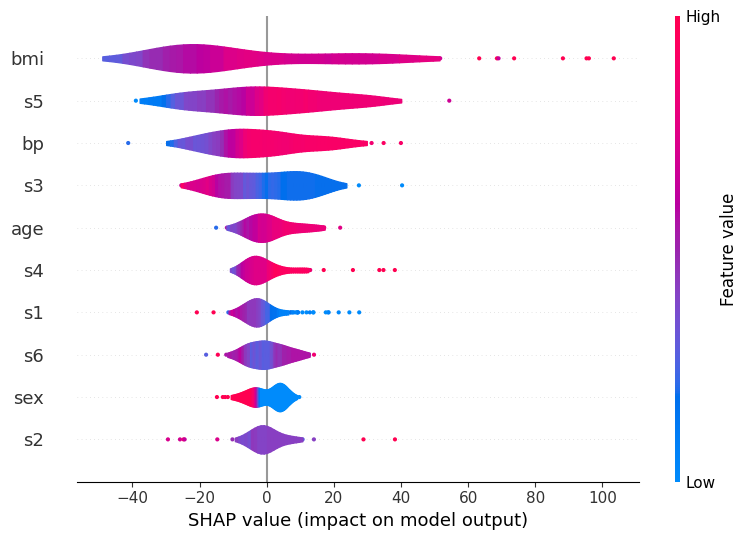

In [220]:
shap.summary_plot(shap_values, x_test, plot_type="violin")

The fact that the red and blue colors are clear and well-separated for the variables sex and s3 shows that if sex changes from 0 to 1, the SHAP value decreases; the same is true for s3, where a decrease leads to a high SHAP value. The opposite effect occurs for variables like bp, s5, and bmi. However, for variables like s2 and s6, the fact that the colors are mixed can be confusing. Finally, we can say that the top three variables—bmi, s5, and bp—have the strongest impact on the prediction and are decisive

<IPython.core.display.Javascript object>

In [239]:
y_pred = regressor.predict(x_test)
index = 2
print("Mean BMI in test data:", np.mean(x_test.bmi))
print("Mean prediction on test data:", np.mean(y_pred))
print("Prediction on our data point:", y_pred[index])
print("Data point:")
print(x_test.iloc[index])

shap.force_plot(explainer.expected_value, shap_values[index,:], x_test.iloc[index,:])

Mean BMI in test data: 26.043150684931508
Mean prediction on test data: 149.2698
Prediction on our data point: 126.554016
Data point:
age     66.0000
sex      2.0000
bmi     26.0000
bp      91.0000
s1     264.0000
s2     146.6000
s3      65.0000
s4       4.0000
s5       5.5683
s6      87.0000
Name: 72, dtype: float64


TypeError: In v0.20, force plot now requires the base value as the first parameter! Try shap.plots.force(explainer.expected_value, shap_values) or for multi-output models try shap.plots.force(explainer.expected_value[0], shap_values[..., 0]).

In [222]:
print(explainer.expected_value)
print(sum(shap_values[index, :]))
print(regressor.predict(x_test)[index])
print(explainer.expected_value + sum(shap_values[index, :]))

154.44574596805717
-27.891726560560564
126.554016
126.55401940749661


In [223]:
print("Base value + sum of the SHAP values=", explainer.expected_value + sum(shap_values[index,:]))

Base value + sum of the SHAP values= 126.55401940749661


In [224]:
explainer = shap.TreeExplainer(regressor, feature_perturbation="tree_path_dependent")
shap_values = explainer.shap_values(x_test)
base = explainer.expected_value
mean_pred = regressor.predict(x_train).mean()
print("Base value:", base, "\nMean prediction on training data:", mean_pred)

Base value: 151.98288 
Mean prediction on training data: 151.98286


In [225]:
batch_size = 64

train_loader = torch.utils.data.DataLoader(
    datasets.MNIST("mnist_data",
        train=True,
        download=True,
        transform=transforms.Compose([transforms.ToTensor()]),
    ),
    batch_size=batch_size,
    shuffle=True,
)


100%|██████████| 9.91M/9.91M [00:00<00:00, 11.4MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 398kB/s]
100%|██████████| 1.65M/1.65M [00:00<00:00, 3.22MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 7.88MB/s]


In [226]:

test_loader = torch.utils.data.DataLoader(
    datasets.MNIST("mnist_data",
        train=False,
        transform=transforms.Compose([transforms.ToTensor()])),
    batch_size=batch_size,
    shuffle=True,
)
# This cell is just for understanding the data loader objects
imgs, lbls = next(iter(test_loader))
print(imgs.shape)  # torch.Size([B, C, H, W])
print(lbls.shape)  # torch.Size([B])

torch.Size([64, 1, 28, 28])
torch.Size([64])


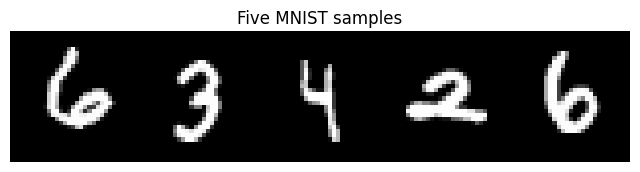

In [227]:
# This cell is just for looking at some of the images
from torchvision.utils import make_grid
imgs5 = imgs[:5]

# Make a grid and plot
grid = make_grid(imgs5, nrow=5, padding=2)
plt.figure(figsize=(8, 2))
plt.imshow(grid.permute(1, 2, 0).squeeze(), cmap="gray")
plt.axis("off")
plt.title("Five MNIST samples")
plt.show()

In [228]:
num_epochs = 5
device = torch.device("cpu")

class Net(nn.Module):
    def __init__(self):
        super().__init__()

        self.conv_layers = nn.Sequential(
            nn.Conv2d(1, 10, kernel_size=5),
            nn.MaxPool2d(2),
            nn.ReLU(),
            nn.Conv2d(10, 20, kernel_size=5),
            nn.Dropout(),
            nn.MaxPool2d(2),
            nn.ReLU(),
        )
        self.fc_layers = nn.Sequential(
            nn.Linear(320, 50),
            nn.ReLU(),
            nn.Dropout(),
            nn.Linear(50, 10),
            nn.Softmax(dim=1),
        )

    def forward(self, x):
        x = self.conv_layers(x)
        x = x.view(-1, 320)
        x = self.fc_layers(x)
        return x


def train(model, device, train_loader, optimizer, epoch):
    model.train()
    for batch_idx, (data, target) in enumerate(train_loader):
        data, target = data.to(device), target.to(device)
        optimizer.zero_grad()
        output = model(data)
        loss = F.nll_loss(output.log(), target)
        loss.backward()
        optimizer.step()
        if batch_idx % 100 == 0:
            print(
                f"Train Epoch: {epoch} [{batch_idx * len(data)}/{len(train_loader.dataset)}"
                f" ({100.0 * batch_idx / len(train_loader):.0f}%)]"
                f"\tLoss: {loss.item():.6f}"
            )


def test(model, device, test_loader):
    model.eval()
    test_loss = 0
    correct = 0
    with torch.no_grad():
        for data, target in test_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += F.nll_loss(output.log(), target).item()  # sum up batch loss
            pred = output.max(1, keepdim=True)[1]  # get the index of the max log-probability
            correct += pred.eq(target.view_as(pred)).sum().item()

    test_loss /= len(test_loader.dataset)
    print(
        f"\nTest set: Average loss: {test_loss:.4f},"
        f" Accuracy: {correct}/{len(test_loader.dataset)}"
        f" ({100.0 * correct / len(test_loader.dataset):.0f}%)\n"
    )

model = Net().to(device)
optimizer = optim.SGD(model.parameters(), lr=0.01, momentum=0.5)

model_file = "mnist_cnn.pt"

if os.path.isfile(model_file):
    print(f"Found model file {model_file}. Loading...")
    state = torch.load(model_file, map_location=device, weights_only=True)
    model.load_state_dict(state, strict=True)
    test(model, device, test_loader)

else:
    print(f"Found no model saved as {model_file}. Training...")
    for epoch in range(1, num_epochs + 1):
        train(model, device, train_loader, optimizer, epoch)
        torch.save(model.state_dict(), model_file)
        test(model, device, test_loader)


Found no model saved as mnist_cnn.pt. Training...
Train Epoch: 1 [0/60000 (0%)]	Loss: 2.338234
Train Epoch: 1 [6400/60000 (11%)]	Loss: 2.201322
Train Epoch: 1 [12800/60000 (21%)]	Loss: 1.352330
Train Epoch: 1 [19200/60000 (32%)]	Loss: 1.235532
Train Epoch: 1 [25600/60000 (43%)]	Loss: 0.919120
Train Epoch: 1 [32000/60000 (53%)]	Loss: 0.645080
Train Epoch: 1 [38400/60000 (64%)]	Loss: 0.606540
Train Epoch: 1 [44800/60000 (75%)]	Loss: 0.999322
Train Epoch: 1 [51200/60000 (85%)]	Loss: 0.725075
Train Epoch: 1 [57600/60000 (96%)]	Loss: 0.602412

Test set: Average loss: 0.0060, Accuracy: 9252/10000 (93%)

Train Epoch: 2 [0/60000 (0%)]	Loss: 0.533506
Train Epoch: 2 [6400/60000 (11%)]	Loss: 0.483765
Train Epoch: 2 [12800/60000 (21%)]	Loss: 0.391643
Train Epoch: 2 [19200/60000 (32%)]	Loss: 0.322124
Train Epoch: 2 [25600/60000 (43%)]	Loss: 0.339501
Train Epoch: 2 [32000/60000 (53%)]	Loss: 0.238364
Train Epoch: 2 [38400/60000 (64%)]	Loss: 0.246490
Train Epoch: 2 [44800/60000 (75%)]	Loss: 0.405000
T

Label: 7
Prediction: 7
Probabilities: [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]


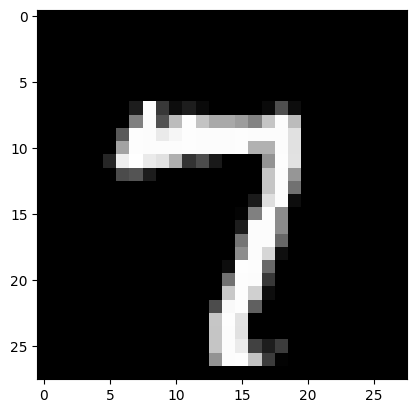

In [229]:
index = 2
model.eval()
with torch.no_grad():
    images, labels = next(iter(test_loader))
    x = images[index-1:index].to(device)
    y = labels[index-1].to(device)

    output = model(x)
    pred = output.argmax(dim=1).item()

print("Label:", y.item())
print("Prediction:", pred)
print(f"Probabilities: {np.round(output.numpy()[0],2)}")

plt.imshow(x.squeeze(), cmap="gray")
plt.show()

In [230]:
# Use ~50–200 images to keep it fast
background, _ = next(iter(train_loader))
background = background[:50].to(device)   # [50, 1, 28, 28]
background.shape

torch.Size([50, 1, 28, 28])

In [231]:
explainer = shap.DeepExplainer(model, background)

In [232]:
test_samples, test_labels = next(iter(test_loader))
N = test_samples.size(0)
idx = torch.randperm(N)[:5]
test_samples = test_samples[idx]          # [5, 1, 28, 28]
test_labels = test_labels[idx]
test_samples.shape

torch.Size([5, 1, 28, 28])

In [233]:
shap_values = explainer.shap_values(test_samples)
shap_values[0].shape

(1, 28, 28, 10)

In [234]:
shap_numpy = list(np.transpose(shap_values, (4, 0, 2, 3, 1)))
test_numpy = np.swapaxes(np.swapaxes(test_samples.numpy(), 1, -1), 1, 2)
print(len(shap_numpy))     # 10
print(shap_numpy[0].shape) # (5, 28, 28, 1)
print(test_numpy.shape)    # (5, 28, 28, 1)

10
(5, 28, 28, 1)
(5, 28, 28, 1)


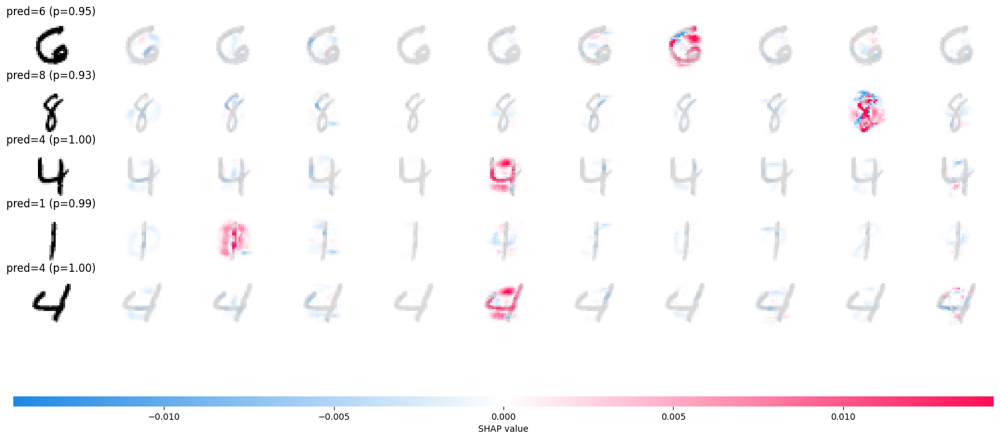

In [235]:
probs = model(test_samples).detach().numpy()      # [N,10]
pred_cls = probs.argmax(axis=1)
row_labels = [f"pred={int(pred_cls[i])} (p={probs[i, pred_cls[i]]:.2f})" for i in range(len(pred_cls))]

shap.image_plot(shap_numpy, -test_numpy, true_labels=row_labels)

In [236]:
explainer.expected_value

array([0.1645287 , 0.12549585, 0.15815438, 0.02984403, 0.07218912,
       0.09378814, 0.08200104, 0.1039097 , 0.08586452, 0.08422447],
      dtype=float32)

In [237]:
sum(explainer.expected_value)

0.9999999552965164